##**Notebook PC#08**
## Simple Recurrent Neural Network, Linear Predictor, MLP and LSTM for multi-step time series prediction.<BR>

**Professor:** Fernando J. Von Zuben <br>
**Aluno(a):** Ariel Góes de Castro <br>
**Aluno(a):** Francisco Germano Vogt

In [1]:
# Loading all the relevant libraries
from pandas import read_csv
from pandas import DataFrame
import numpy as np
import pandas as pd
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, SimpleRNN, LSTM, GRU
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import math
import matplotlib.pyplot as plt

2024-06-10 15:19:18.146519: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-06-10 15:19:18.387147: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-10 15:19:18.387249: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-10 15:19:18.417259: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-10 15:19:18.487096: I tensorflow/core/platform/cpu_feature_guar

## **A base [unemployment rate] foi baixada no [link](https://fred.stlouisfed.org/series/UNRATE).**

In [2]:
# Structuring the dataset from a single time series, scaling and spliting into training / testing
def get_train_test(dataset, split_percent, time_steps, horizon):
    df = read_csv(dataset, usecols=[1], engine='python')
    data = np.array(df.values.astype('float32'))
    scaler = MinMaxScaler(feature_range=(0, 1))
    # There is a kind of data leakage in the next command
    data = scaler.fit_transform(data).flatten()
    n = len(data)
    df = DataFrame()
    for i in range(0,time_steps):
      df['t-' + str(time_steps-i-1)] = [data[j] for j in range(i, (len(data)-horizon-time_steps+i+1))]
    for i in range(1,horizon+1):
      df['t+' + str(i)] = [data[j] for j in range(time_steps+i-1, (len(data)-horizon+i))]
    print(df)
    df1 = df.copy()
    for i in range(1,horizon+1):
      df1 = df1.drop(['t+' + str(i)], axis = 1)
    dataX = np.array(df1) #separacao de dados de time_steps
    df2 = df['t+1']
    for i in range(2,horizon+1):
      df2 = pd.concat([df2, df['t+' + str(i)]], axis=1)
    datay = np.array(df2) #separacao de dados de horizon
    # Point for splitting data into train and test
    split = int(n*split_percent)
    X = dataX[range(split),:]
    y = datay[range(split)]
    Xt = dataX[split:,:]
    yt = datay[split:]
    return X, y, Xt, yt

time_steps = 11
horizon = 3
# Here you will decide which dataset to consider.
X, y, Xt, yt = get_train_test('unemployment_rate.csv', 0.8, time_steps, horizon)
#X, y, Xt, yt = get_train_test('monthly_sunspot.csv', 0.8, time_steps, horizon)

         t-10       t-9       t-8       t-7       t-6       t-5       t-4  \
0    0.073171  0.105691  0.121951  0.113821  0.081301  0.089431  0.089431   
1    0.105691  0.121951  0.113821  0.081301  0.089431  0.089431  0.113821   
2    0.121951  0.113821  0.081301  0.089431  0.089431  0.113821  0.105691   
3    0.113821  0.081301  0.089431  0.089431  0.113821  0.105691  0.097561   
4    0.081301  0.089431  0.089431  0.113821  0.105691  0.097561  0.105691   
..        ...       ...       ...       ...       ...       ...       ...   
897  0.089431  0.089431  0.081301  0.073171  0.089431  0.081301  0.073171   
898  0.089431  0.081301  0.073171  0.089431  0.081301  0.073171  0.097561   
899  0.081301  0.073171  0.089431  0.081301  0.073171  0.097561  0.089431   
900  0.073171  0.089431  0.081301  0.073171  0.097561  0.089431  0.081301   
901  0.089431  0.081301  0.073171  0.097561  0.089431  0.081301  0.105691   

          t-3       t-2       t-1       t-0       t+1       t+2       t+3  

In [3]:
print(X.shape)
print(y.shape)

(732, 11)
(732, 3)


## **Implementing the simple recurrent neural network**

In [4]:
# Execute this cell or the cell associated with one of the other predictors. They are mutually exclusive.
def create_RNN(hidden_units, dense_units, input_shape, activation):
        model = Sequential()
        model.add(SimpleRNN(hidden_units, activation=activation[0], input_shape=input_shape))
        model.add(Dense(units=dense_units, activation=activation[1]))
        model.compile(loss='mean_squared_error', optimizer='adam')
        return model

def RNN_predictor (X, y, time_steps):
    model = create_RNN(hidden_units=30, dense_units=horizon, input_shape=(time_steps,1), activation=['tanh', 'tanh'])
    train_predict = model.fit(X, y, epochs=20, batch_size=1, verbose=2)
    return model

RNN_model = RNN_predictor(X, y, time_steps)

2024-06-10 15:19:21.722700: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-06-10 15:19:21.858860: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-06-10 15:19:21.859199: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

Epoch 1/20


2024-06-10 15:19:24.062516: I external/local_xla/xla/service/service.cc:168] XLA service 0x7f4b0d9e7a50 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-06-10 15:19:24.062564: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce GTX 1650, Compute Capability 7.5
2024-06-10 15:19:24.075689: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-06-10 15:19:24.108335: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8904
I0000 00:00:1718043564.224635   55316 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


732/732 - 6s - loss: 0.0028 - 6s/epoch - 8ms/step
Epoch 2/20
732/732 - 4s - loss: 0.0012 - 4s/epoch - 5ms/step
Epoch 3/20
732/732 - 4s - loss: 9.7529e-04 - 4s/epoch - 6ms/step
Epoch 4/20
732/732 - 4s - loss: 8.7242e-04 - 4s/epoch - 6ms/step
Epoch 5/20
732/732 - 4s - loss: 8.3614e-04 - 4s/epoch - 6ms/step
Epoch 6/20
732/732 - 4s - loss: 7.9485e-04 - 4s/epoch - 5ms/step
Epoch 7/20
732/732 - 4s - loss: 7.4768e-04 - 4s/epoch - 6ms/step
Epoch 8/20
732/732 - 3s - loss: 7.5232e-04 - 3s/epoch - 5ms/step
Epoch 9/20
732/732 - 4s - loss: 7.6153e-04 - 4s/epoch - 5ms/step
Epoch 10/20
732/732 - 4s - loss: 7.0788e-04 - 4s/epoch - 6ms/step
Epoch 11/20
732/732 - 4s - loss: 7.1821e-04 - 4s/epoch - 5ms/step
Epoch 12/20
732/732 - 4s - loss: 7.3324e-04 - 4s/epoch - 6ms/step
Epoch 13/20
732/732 - 4s - loss: 6.9986e-04 - 4s/epoch - 5ms/step
Epoch 14/20
732/732 - 5s - loss: 7.2704e-04 - 5s/epoch - 6ms/step
Epoch 15/20
732/732 - 4s - loss: 6.9009e-04 - 4s/epoch - 5ms/step
Epoch 16/20
732/732 - 4s - loss: 6.953

In [5]:
# [Do not run this cell] or [Upload the PNG file and then run].
# Configuration of the simple RNN
from IPython.display import Image
Image("RNN_info_flow.png", width = 600, height = 300)

FileNotFoundError: No such file or directory: 'RNN_info_flow.png'

FileNotFoundError: No such file or directory: 'RNN_info_flow.png'

<IPython.core.display.Image object>

In [6]:
wx = RNN_model.get_weights()[0]
wh = RNN_model.get_weights()[1]
bh = RNN_model.get_weights()[2]
wy = RNN_model.get_weights()[3]
by = RNN_model.get_weights()[4]
print(wx.shape)
print(wh.shape)
print(bh.shape)
print(wy.shape)
print(by.shape)

(1, 30)
(30, 30)
(30,)
(30, 3)
(3,)


## **Implementing a linear predictor**

In [7]:
# Execute this cell or the cell associated with one of the other predictors. They are mutually exclusive.
def linear_predictor(X,y):
    model = LinearRegression()
    train_predict = model.fit(X, y)
    print(model.coef_)
    print(model.intercept_)

    return model

linear_model = linear_predictor(X,y)

[[ 0.11851791 -0.12171954 -0.02107652  0.05709252 -0.03613588 -0.12773344
   0.03432398 -0.08036207 -0.07273561  0.2400802   0.9935693 ]
 [ 0.0758187   0.0424097  -0.13451555  0.02920165  0.01571931 -0.1573497
  -0.09819728 -0.04601844 -0.15392926  0.16570799  1.2284961 ]
 [ 0.21077242 -0.12918359 -0.00265074 -0.0681376  -0.01591382 -0.13397469
  -0.10556196 -0.18870404 -0.14540264  0.13890311  1.3892747 ]]
[0.00447327 0.00899121 0.01394947]


## **Implementing the multilayer perceptron neural network (MLP)**

In [8]:
# Execute this cell or the cell associated with one of the other predictors. They are mutually exclusive.
def MLP_predictor():
  model = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(80, activation=tf.nn.tanh),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(horizon, activation='linear')
  ])
  model.compile(optimizer='adam', loss='mean_squared_error')
  train_predict = model.fit(X, y, epochs=100)
  model.summary()

  return model

MLP_model = MLP_predictor()

Epoch 1/100
23/23 [==============================] - 2s 3ms/step - loss: 0.0303
Epoch 2/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0141
Epoch 3/100
23/23 [==============================] - 0s 3ms/step - loss: 0.0101
Epoch 4/100
23/23 [==============================] - 0s 3ms/step - loss: 0.0083
Epoch 5/100
23/23 [==============================] - 0s 3ms/step - loss: 0.0068
Epoch 6/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0054
Epoch 7/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0047
Epoch 8/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0038
Epoch 9/100
23/23 [==============================] - 0s 3ms/step - loss: 0.0034
Epoch 10/100
23/23 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 11/100
23/23 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 12/100
23/23 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 13/100
23/23 [=================

## **Implementing the long short-term memory network (LSTM)**

In [9]:
def LSTM_predictor(X, y, time_steps):
    X1 = X.reshape(X.shape[0],time_steps,1)
    model=Sequential()
    model.add(LSTM(25,input_shape=(time_steps,1)))
    model.add(Dense(horizon,activation='linear'))
    model.compile(loss='mean_squared_error',optimizer='adam')

    train_predict = model.fit(X1,y,epochs=200,verbose=2)

    return model

LSTM_model = LSTM_predictor(X, y, time_steps)
print(LSTM_model.summary())

Epoch 1/200
23/23 - 2s - loss: 0.0376 - 2s/epoch - 74ms/step
Epoch 2/200
23/23 - 0s - loss: 0.0068 - 77ms/epoch - 3ms/step
Epoch 3/200
23/23 - 0s - loss: 0.0051 - 71ms/epoch - 3ms/step
Epoch 4/200
23/23 - 0s - loss: 0.0042 - 76ms/epoch - 3ms/step
Epoch 5/200
23/23 - 0s - loss: 0.0037 - 81ms/epoch - 4ms/step
Epoch 6/200
23/23 - 0s - loss: 0.0035 - 71ms/epoch - 3ms/step
Epoch 7/200
23/23 - 0s - loss: 0.0033 - 78ms/epoch - 3ms/step
Epoch 8/200
23/23 - 0s - loss: 0.0032 - 77ms/epoch - 3ms/step
Epoch 9/200
23/23 - 0s - loss: 0.0031 - 79ms/epoch - 3ms/step
Epoch 10/200
23/23 - 0s - loss: 0.0030 - 77ms/epoch - 3ms/step
Epoch 11/200
23/23 - 0s - loss: 0.0030 - 75ms/epoch - 3ms/step
Epoch 12/200
23/23 - 0s - loss: 0.0028 - 92ms/epoch - 4ms/step
Epoch 13/200
23/23 - 0s - loss: 0.0027 - 77ms/epoch - 3ms/step
Epoch 14/200
23/23 - 0s - loss: 0.0026 - 76ms/epoch - 3ms/step
Epoch 15/200
23/23 - 0s - loss: 0.0024 - 75ms/epoch - 3ms/step
Epoch 16/200
23/23 - 0s - loss: 0.0024 - 90ms/epoch - 4ms/step
Ep

In [10]:
def print_error(trainY, testY, train_predict, test_predict,i):
    # Error of predictions
    train_rmse = math.sqrt(mean_squared_error(trainY, train_predict))
    test_rmse = math.sqrt(mean_squared_error(testY, test_predict))
    # Print RMSE
    print('t+%d RMSE train: %.3f RMSE' % (i+1, train_rmse))
    print('t+%d RMSE test: %.3f RMSE' % (i+1, test_rmse))
    return [train_rmse, test_rmse]


def RMSE(train_predict, test_predict):
  rmse = []
  for i in range(horizon):
    if(horizon == 1):
      y1_pred = train_predict
      y1_pred_t = test_predict
      y1 = y
      y1_t = yt
    elif(horizon > 1):
      y1_pred = train_predict[:,i]
      y1_pred_t = test_predict[:,i]
      y1 = y[:,i]
      y1_t = yt[:,i]

    erro = print_error(y1, y1_t, y1_pred, y1_pred_t,i)
    rmse.append(erro)

  # Create a DataFrame from the rmse values for each horizon
  df = pd.DataFrame(rmse)
  df.columns = ['train', 'test']
  return df


In [11]:
# Plot the predictions together with the actual values
def plot_result(trainY, testY, train_predict, test_predict,i):
    actual = np.append(trainY, testY)
    predictions = np.append(train_predict, test_predict)
    rows = len(actual)
    plt.figure(figsize=(30, 6), dpi=300)
    plt.plot(range(rows), actual)
    plt.plot(range(rows), predictions)
    plt.axvline(x=len(trainY), color='r')
    plt.legend(['Actual', 'Predictions'])
    plt.xlabel('Time steps')
    plt.ylabel('Actual and Predicted Values')
    plt.title('t+%d Predition (The Red Line Separates The Training And Test Examples)' % (i+1))
    plt.grid(True)

def plot_predict(train_predict, test_predict, y, yt):
  for i in range(horizon):
    if(horizon == 1):
      y1_pred = train_predict
      y1_pred_t = test_predict
      y1 = y
      y1_t = yt
    elif(horizon > 1):
      y1_pred = train_predict[:,i]
      y1_pred_t = test_predict[:,i]
      y1 = y[:,i]
      y1_t = yt[:,i]
    plot_result(y1, y1_t, y1_pred, y1_pred_t,i)


***** RNN MODEL *****
6/6 [==============================] - 0s 5ms/step
t+1 RMSE train: 0.018 RMSE
t+1 RMSE test: 0.069 RMSE
t+2 RMSE train: 0.024 RMSE
t+2 RMSE test: 0.095 RMSE
t+3 RMSE train: 0.031 RMSE
t+3 RMSE test: 0.111 RMSE


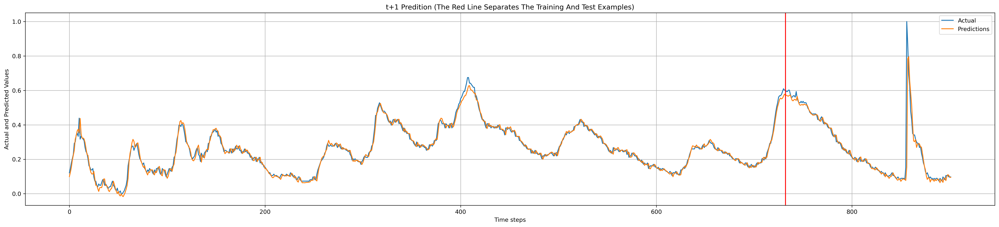

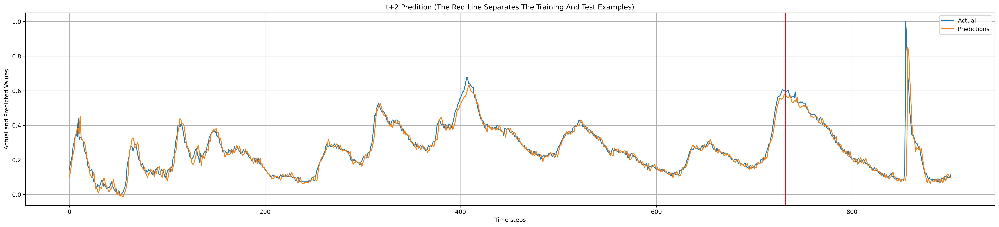

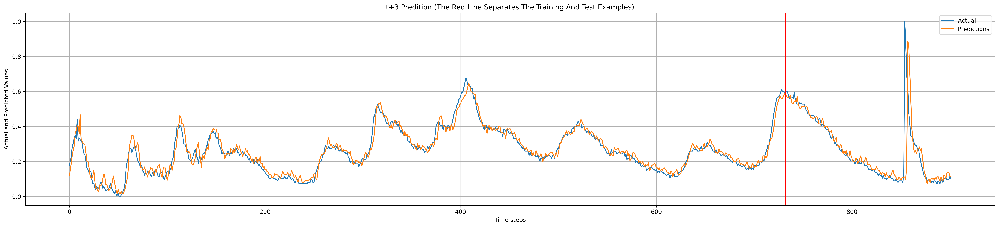

In [12]:
print ('***** RNN MODEL *****')
train_predict = RNN_model.predict(X)
test_predict = RNN_model.predict(Xt)
df1 = RMSE(train_predict, test_predict)
plot_predict(train_predict, test_predict, y, yt)

***** LINEAR MODEL *****
t+1 RMSE train: 0.016 RMSE
t+1 RMSE test: 0.077 RMSE
t+2 RMSE train: 0.022 RMSE
t+2 RMSE test: 0.114 RMSE
t+3 RMSE train: 0.030 RMSE
t+3 RMSE test: 0.141 RMSE


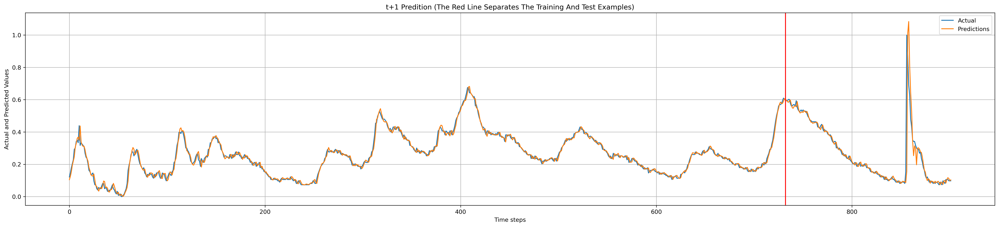

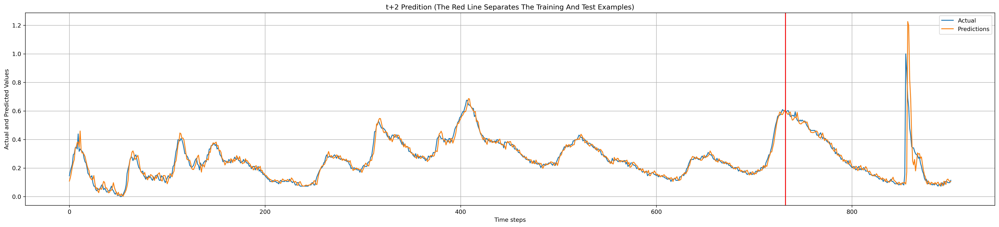

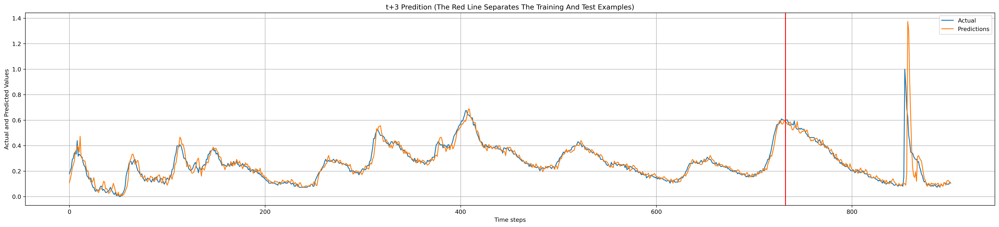

In [13]:
print ('***** LINEAR MODEL *****')
train_predict = linear_model.predict(X)
test_predict = linear_model.predict(Xt)
df2 = RMSE(train_predict, test_predict)
plot_predict(train_predict, test_predict, y, yt)

***** MLP MODEL *****
6/6 [==============================] - 0s 2ms/step
t+1 RMSE train: 0.019 RMSE
t+1 RMSE test: 0.081 RMSE
t+2 RMSE train: 0.024 RMSE
t+2 RMSE test: 0.113 RMSE
t+3 RMSE train: 0.031 RMSE
t+3 RMSE test: 0.138 RMSE


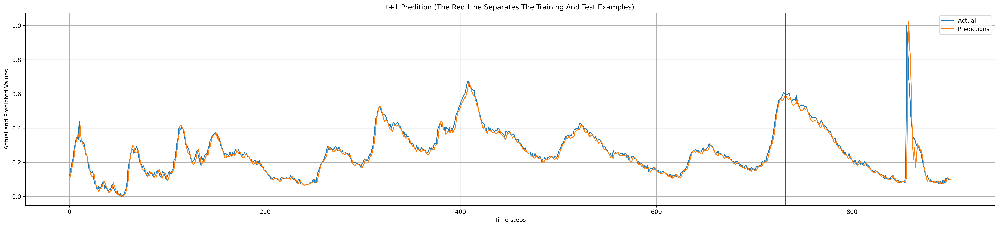

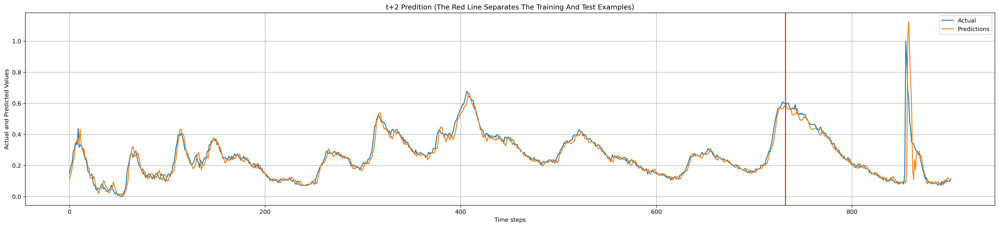

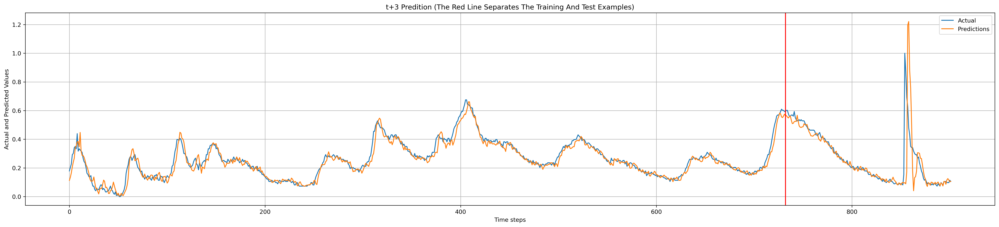

In [14]:
print ('***** MLP MODEL *****')
train_predict = MLP_model.predict(X)
test_predict = MLP_model.predict(Xt)
df3 = RMSE(train_predict, test_predict)
plot_predict(train_predict, test_predict, y, yt)

***** LSTM MODEL *****
6/6 [==============================] - 0s 2ms/step
t+1 RMSE train: 0.016 RMSE
t+1 RMSE test: 0.080 RMSE
t+2 RMSE train: 0.023 RMSE
t+2 RMSE test: 0.114 RMSE
t+3 RMSE train: 0.031 RMSE
t+3 RMSE test: 0.139 RMSE


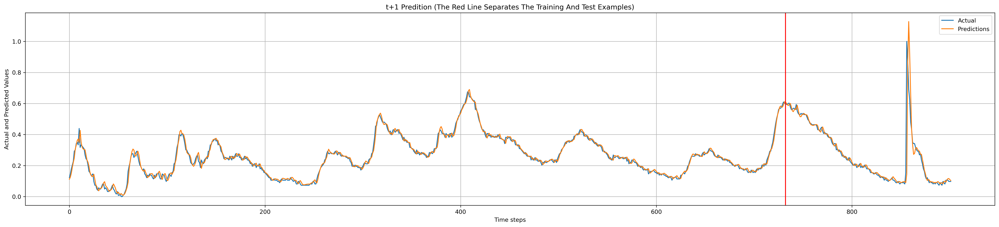

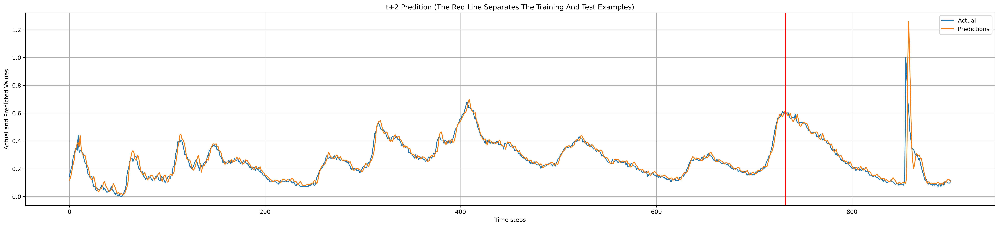

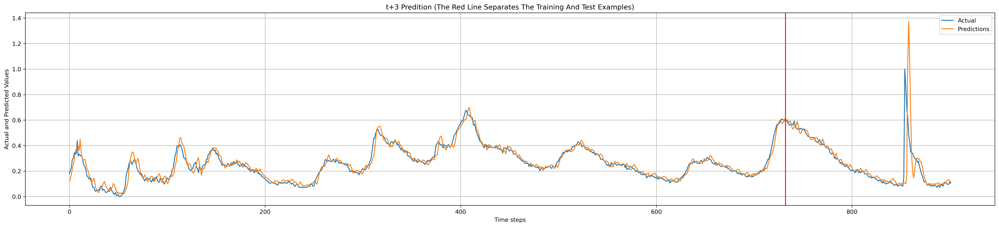

In [15]:
print ('***** LSTM MODEL *****')
train_predict = LSTM_model.predict(X)
test_predict = LSTM_model.predict(Xt)
df4 = RMSE(train_predict, test_predict)
plot_predict(train_predict, test_predict, y, yt)

In [16]:
# Plot the prediction error
def plot_result2(trainY, testY, train_predict, test_predict,i):
    actual = np.append(trainY, testY)
    predictions = np.append(train_predict, test_predict)
    rows = len(actual)
    plt.figure(figsize=(30, 6), dpi=300)
    plt.plot(range(rows), actual - predictions)
    plt.axvline(x=len(trainY), color='r')
    plt.xlabel('Time steps')
    plt.ylabel('Actual minus Predicted Values')
    plt.title('t+%d Predition Error (The Red Line Separates The Training And Test Examples)' % (i+1))
    plt.ylim(-0.5, +1.0) # Please, set the interval appropriately, considering all the graphs.
    plt.grid(True)

def plot_error_predict(train_predict, test_predict, y, yt):
    for i in range(horizon):
      if(horizon == 1):
        y1_pred = train_predict
        y1_pred_t = test_predict
        y1 = y
        y1_t = yt
      elif(horizon > 1):
        y1_pred = train_predict[:,i]
        y1_pred_t = test_predict[:,i]
        y1 = y[:,i]
        y1_t = yt[:,i]
      plot_result2(y1, y1_t, y1_pred, y1_pred_t,i)

***** RNN MODEL *****
6/6 [==============================] - 0s 2ms/step


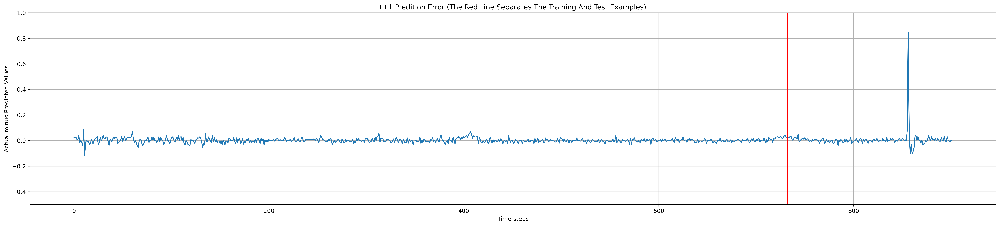

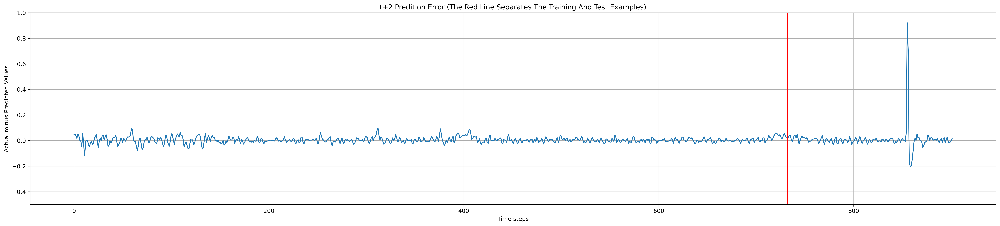

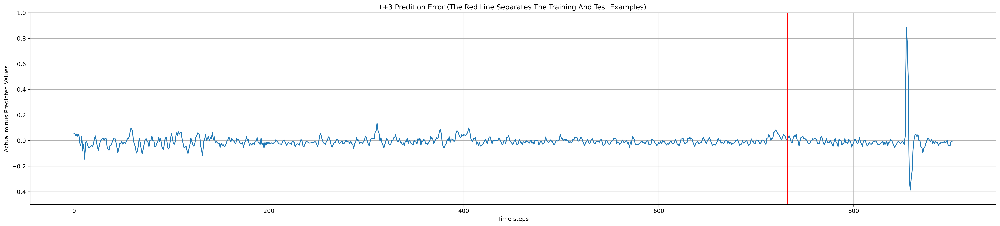

In [17]:
print ('***** RNN MODEL *****')
train_predict = RNN_model.predict(X)
test_predict = RNN_model.predict(Xt)
plot_error_predict(train_predict, test_predict, y, yt)


***** LINEAR MODEL *****


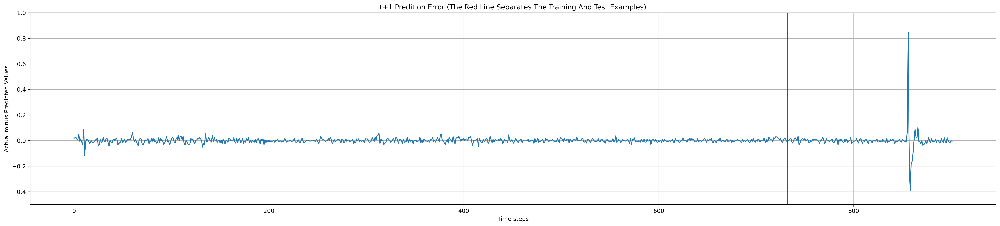

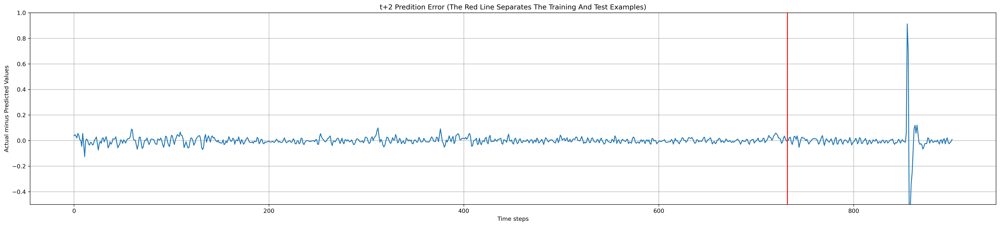

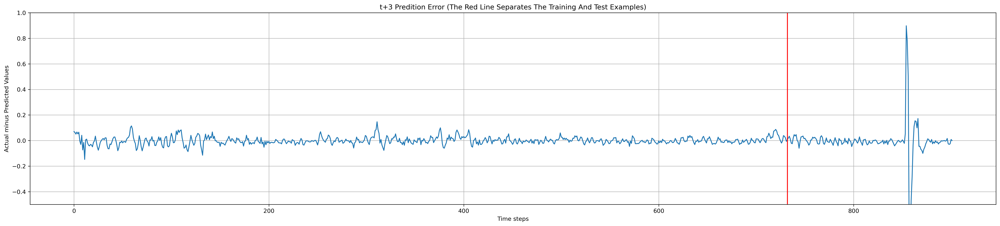

In [18]:
print ('***** LINEAR MODEL *****')
train_predict = linear_model.predict(X)
test_predict = linear_model.predict(Xt)
plot_error_predict(train_predict, test_predict, y, yt)

***** MLP MODEL *****
6/6 [==============================] - 0s 2ms/step


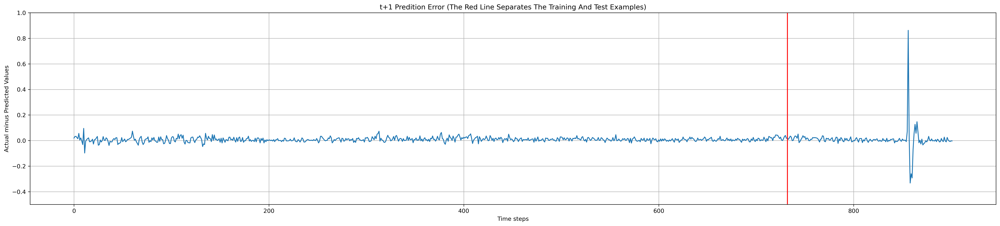

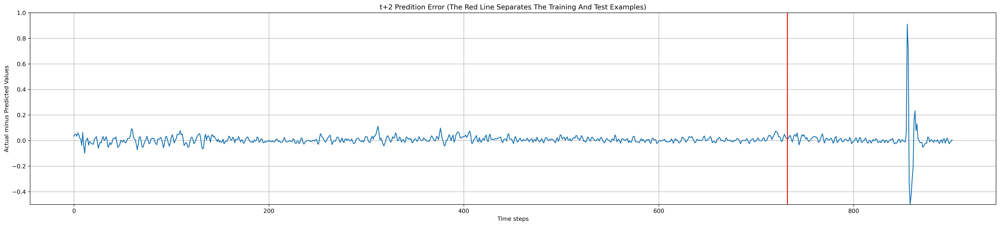

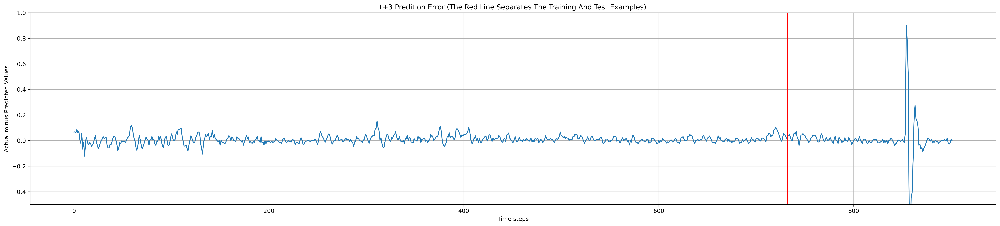

In [19]:
print ('***** MLP MODEL *****')
train_predict = MLP_model.predict(X)
test_predict = MLP_model.predict(Xt)
plot_error_predict(train_predict, test_predict, y, yt)

***** LSTM MODEL *****
6/6 [==============================] - 0s 2ms/step


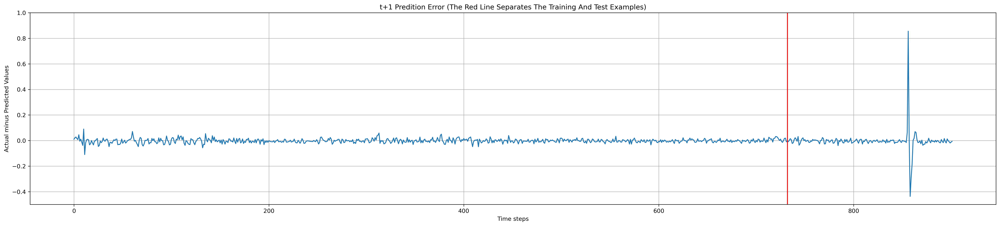

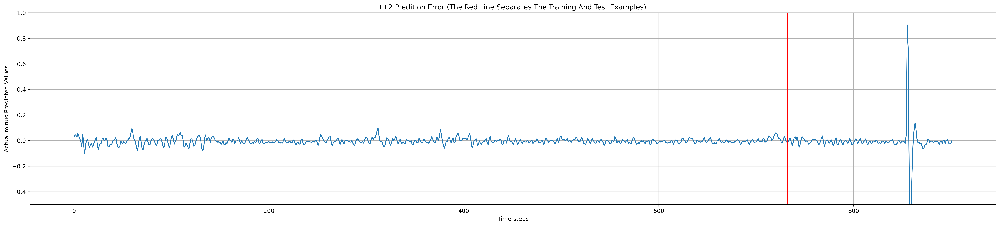

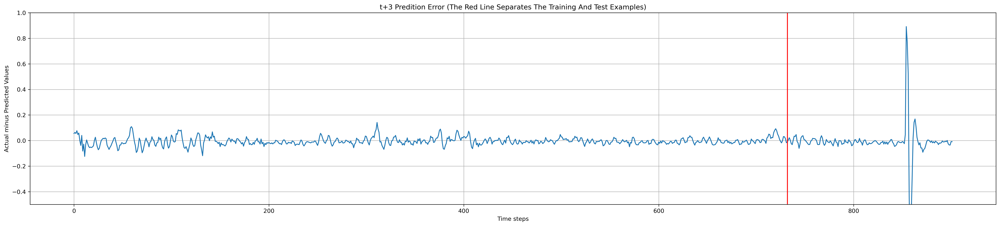

In [20]:
print ('***** LSTM MODEL *****')
train_predict = LSTM_model.predict(X)
test_predict = LSTM_model.predict(Xt)
plot_error_predict(train_predict, test_predict, y, yt)

## **Exhibit a dataframe with the final results for each predictor**

In [21]:
DF_results = pd.concat([df1, df2, df3, df4], axis=1, keys=['RNN', 'LINEAR', 'MLP', 'LSTM'])
DF_results.index = ['t+1', 't+2', 't+3']
DF_results

RNN              LINEAR                 MLP                LSTM  \
        train      test     train      test     train      test     train   
t+1  0.017543  0.068591  0.015883  0.076998  0.018677  0.080555  0.016416   
t+2  0.023727  0.094940  0.022425  0.114303  0.024090  0.113469  0.023408   
t+3  0.030895  0.110999  0.029590  0.141454  0.031479  0.137644  0.030562   

               
         test  
t+1  0.079835  
t+2  0.114099  
t+3  0.138690

## **Use the SimpleRNN model to make a search for the best [time_steps].**

In [22]:
time_steps = [1, 2, 7, 11, 50]
horizon = 3
DF1 = pd.DataFrame()

for timesteps in time_steps:
    X, y, Xt, yt = get_train_test('unemployment_rate.csv', 0.8, timesteps, horizon)
    RNN_model = RNN_predictor(X, y, timesteps)
    train_predict = RNN_model.predict(X)
    test_predict = RNN_model.predict(Xt)
    rmse  = RMSE(train_predict, test_predict)
    rmse.columns = pd.MultiIndex.from_product([[timesteps], rmse.columns])
    DF1 = pd.concat([DF1, rmse], axis=1)

          t-0       t+1       t+2       t+3
0    0.073171  0.105691  0.121951  0.113821
1    0.105691  0.121951  0.113821  0.081301
2    0.121951  0.113821  0.081301  0.089431
3    0.113821  0.081301  0.089431  0.089431
4    0.081301  0.089431  0.089431  0.113821
..        ...       ...       ...       ...
907  0.105691  0.105691  0.105691  0.097561
908  0.105691  0.105691  0.097561  0.097561
909  0.105691  0.097561  0.097561  0.097561
910  0.097561  0.097561  0.097561  0.113821
911  0.097561  0.097561  0.113821  0.105691

[912 rows x 4 columns]
Epoch 1/20
732/732 - 3s - loss: 0.0109 - 3s/epoch - 4ms/step
Epoch 2/20
732/732 - 2s - loss: 9.4015e-04 - 2s/epoch - 2ms/step
Epoch 3/20
732/732 - 1s - loss: 8.6385e-04 - 1s/epoch - 2ms/step
Epoch 4/20
732/732 - 2s - loss: 8.7115e-04 - 2s/epoch - 2ms/step
Epoch 5/20
732/732 - 1s - loss: 8.9064e-04 - 1s/epoch - 2ms/step
Epoch 6/20
732/732 - 2s - loss: 8.7379e-04 - 2s/epoch - 2ms/step
Epoch 7/20
732/732 - 1s - loss: 8.7954e-04 - 1s/epoch - 2ms/st

In [23]:
DF1.index = ['t+1', 't+2', 't+3']
DF1

1                   2                   7                   11  \
        train      test     train      test     train      test     train   
t+1  0.019239  0.066931  0.022350  0.067075  0.017513  0.067362  0.018895   
t+2  0.027179  0.093128  0.029288  0.092362  0.024730  0.094031  0.023936   
t+3  0.036291  0.108416  0.034815  0.106190  0.031552  0.109573  0.031096   

                     50            
         test     train      test  
t+1  0.067677  0.020045  0.079409  
t+2  0.094069  0.023365  0.111407  
t+3  0.110769  0.031373  0.134269

## **Use the LSTM model to make a search for the best [time_steps].**

In [24]:
time_steps = [1, 2, 7, 11, 50]
horizon = 3
DF2 = pd.DataFrame()

for timesteps in time_steps:
    X, y, Xt, yt = get_train_test('unemployment_rate.csv', 0.8, timesteps, horizon)
    LSTM_model = LSTM_predictor(X, y, timesteps)
    train_predict = LSTM_model.predict(X)
    test_predict = LSTM_model.predict(Xt)
    rmse  = RMSE(train_predict, test_predict)
    rmse.columns = pd.MultiIndex.from_product([[timesteps], rmse.columns])
    DF2 = pd.concat([DF2, rmse], axis=1)

          t-0       t+1       t+2       t+3
0    0.073171  0.105691  0.121951  0.113821
1    0.105691  0.121951  0.113821  0.081301
2    0.121951  0.113821  0.081301  0.089431
3    0.113821  0.081301  0.089431  0.089431
4    0.081301  0.089431  0.089431  0.113821
..        ...       ...       ...       ...
907  0.105691  0.105691  0.105691  0.097561
908  0.105691  0.105691  0.097561  0.097561
909  0.105691  0.097561  0.097561  0.097561
910  0.097561  0.097561  0.097561  0.113821
911  0.097561  0.097561  0.113821  0.105691

[912 rows x 4 columns]
Epoch 1/200
23/23 - 2s - loss: 0.0630 - 2s/epoch - 89ms/step
Epoch 2/200
23/23 - 0s - loss: 0.0417 - 74ms/epoch - 3ms/step
Epoch 3/200
23/23 - 0s - loss: 0.0252 - 85ms/epoch - 4ms/step
Epoch 4/200
23/23 - 0s - loss: 0.0145 - 74ms/epoch - 3ms/step
Epoch 5/200
23/23 - 0s - loss: 0.0100 - 73ms/epoch - 3ms/step
Epoch 6/200
23/23 - 0s - loss: 0.0087 - 79ms/epoch - 3ms/step
Epoch 7/200
23/23 - 0s - loss: 0.0082 - 76ms/epoch - 3ms/step
Epoch 8/200
23/

In [25]:
DF2.index = ['t+1', 't+2', 't+3']
DF2

1                   2                   7                   11  \
        train      test     train      test     train      test     train   
t+1  0.017642  0.067939  0.018499  0.068901  0.017199  0.076716  0.017232   
t+2  0.026093  0.096569  0.027070  0.094238  0.022974  0.108696  0.023899   
t+3  0.035074  0.111903  0.035974  0.109267  0.030583  0.130320  0.030874   

                     50            
         test     train      test  
t+1  0.077338  0.015555  0.092502  
t+2  0.115280  0.023917  0.135290  
t+3  0.136756  0.027973  0.162026

<font color="green">
(a)	Explique o papel dos parâmetros de projeto [time_steps] e [horizon].
</font>

**Resposta:**<BR>

No contexto de séries temporais, os dados de entrada consistem em uma sequência de medidas de intervalo de tempo. Para entrada no modelo de predição temporal, podemos configurar um número de dados observados no passado, isto é os *time_steps* de dados históricos para prever saídas futuras. Assim,o modelo tenta prever os valores para a próxima saída em etapas do horizonte no futuro. Neste caso, o horizonte é definido como 3 em todos os algoritmos, em que os diferentes modelos prevêm as taxas de desemprego para os próximos três períodos. Ou seja, o horizonte (*horizon*) refere-se ao número de etapas futuras que o modelo está tentando prever. Essencialmente, *horizon* define o quão longe o modelo pretende fazer uma previsão. Se a rede for recorrente, cada predição é retroalimentada até o valor do horizonte. Enquanto que, em rede não-recorrentes, pode existir linhas de derivação de atraso e o modelo prevê diretamente K passos no futuro.


<font color="green">
(b)	Qual a diferença no uso do parâmetro [time_steps] no caso dos preditores não-recorrentes e no caso do bloco LSTM?
</font>

**Resposta:**<BR>

A diferença está em como os modelos lidam com dados passados para predição. Os modelos não-recorrentes tratam o **time_steps** como uma única janela, tratando os dados como features independentes na predição sem considerar relações temporais subjacentes com os dados mais antigos no histórico. Já, modelos recorrentes (como a LSTM), atuam como um modelo sequencial, processando informações uma etapa de cada vez. Uma LSTM utiliza o **time_steps** para definir o número de pontos de dados anteriores que considera para cada previsão, levando em consideração a ordem e as dependências temporais entre esses pontos de dados anteriores por meio de seu mecanismo de memória interna. Isso acontece, porque na prática, um bloco LSTM é um bloco de redes recorrentes e essas, por sua vez, possuem duas dinâmicas: (i) dos pesos e (ii) da própria rede. Após ajustar os pesos, ainda existem a dinâmica da rede, estimulada pelos dados, que é aproximada.


<font color="green">
(c)	Qual modelo de predição levou a um melhor desempenho junto aos dados de teste em cada caso?
</font>

**Resposta:**<BR>

A tabela abaixo mostra o Root Mean Squared Error (RMSE) para diferentes abordagens de previsão em uma tarefa de previsão de série temporal. Ele compara o desempenho dos modelos RNN (Rede Neural Recorrente), Regressão Linear, MLP (Perceptron Multicamada) e LSTM (Long Short-Term Memory).

**UNEMPLOYMENT RATE**

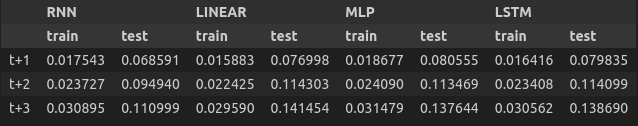

Para cada um dos intervalos de tempo (t+1, t+2, t+3), o modelo RNN apresentou consistentemente melhor desempenho nos dados de teste em comparação aos modelos Linear, MLP e LSTM. Portanto, o modelo RNN proporcionou melhor desempenho nos dados de teste em todos os casos.

Embora seja geralmente esperado que LSTMs (redes de memória longa e de curto prazo) possam superar as RNNs (redes neurais recorrentes) padrão devido à sua capacidade de lidar com dependências de longo prazo e mitigar o problema do gradiente de desaparecimento, o desempenho específico de um modelo pode depender de vários fatores como:

_Características dos dados:_ O conjunto de dados pode ter padrões simples o suficiente para serem capturados por um RNN, sem a necessidade de mecanismos avançados fornecidos por um LSTM. Se os dados não tiverem dependências de longo prazo, as vantagens do LSTM poderão não ser utilizadas.

_Hiperparâmetros do modelo:_ O RNN pode ter sido melhor ajustado que o LSTM. As configurações de hiperparâmetros, como taxa de aprendizagem, unidades ocultas, tamanho do lote, etc., desempenham um papel significativo no desempenho do modelo.

_Complexidade e overfitting do modelo:_ LSTMs são mais complexos e possuem mais parâmetros que RNNs. Para um determinado conjunto de dados, especialmente se for pequeno ou sem complexidade, isso pode levar a um ajuste excessivo, onde o modelo tem um bom desempenho nos dados de treinamento, mas um desempenho ruim nos dados de teste. As RNNs, sendo mais simples, podem generalizar melhor nesses casos.

_Duração do treinamento:_ A quantidade de tempo de treinamento e o número de épocas podem afetar o desempenho. Se ambos os modelos não tivessem sido treinados suficientemente, o RNN poderia ter alcançado um melhor ótimo local mais rapidamente devido à sua simplicidade.

<font color="green">
(d)	Ao se variar o [horizon], apresente uma hipótese para a perda de desempenho conforme [horizon] cresce de 1 até 3, comportamento produzido por todos os modelos de predição, nos dois casos de estudo.
</font>

**Resposta:**<BR>

A cada predição realiza no futuro, existe um erro associado do valor de saída. Conforme eu aumento o tamanho do horizonte a ser visualizado no futuro, o erro se acumula. Por exemplo, assumindo um *horizon=5* e prever o próximo valor futuro, vou realimentar esse valor para a próxima entrada, que servirá como base para prever o próximo valor, e assim por diante. Portanto, quanto maior a janela de horizonte desejada, maior tende a ser o erro de previsão.

<font color="green">
(e)	Ao se variar o [time_steps] especificamente para os modelos SimpleRNN e LSTM, procure explicar o comportamento observado em cada caso de estudo.
</font>

**Resposta:**<BR>

Variações de time_steps podem afetar o comportamento dos modelos RNN e LSTM em geral:

**Modelo RNN:**

Time_steps baixos: Se os pontos de dados passados ​​recentes contiverem as informações mais significativas para prever valores futuros, uma configuração de time_steps baixa pode ser suficiente para o RNN capturar essas dependências e ter um bom desempenho (como o Caso 1 na explicação anterior).
Time_steps elevados: Incluir um grande número de pontos de dados anteriores pode ser prejudicial para RNNs. O problema do gradiente evanescente pode ocorrer, onde os gradientes se tornam muito pequenos ou desaparecem durante a retropropagação. Isto torna difícil para a RNN aprender com informações passadas distantes, levando potencialmente a um pior desempenho, especialmente para dependências de longo prazo (como o Caso 2).

**Modelo LSTM:**

Time_steps baixos: Semelhante aos RNNs, uma configuração de time_steps baixa pode ser adequada se os pontos de dados anteriores recentes forem mais importantes. No entanto, os LSTMs podem potencialmente lidar com dependências um pouco mais longas em comparação com os RNNs devido ao seu mecanismo de memória interna.
Time_steps altos: LSTMs se beneficiam mais de uma gama mais ampla de time_steps em comparação com RNNs porque suas células de memória podem lidar com dependências de longo prazo. Até certo ponto, o aumento dos passos de tempo pode permitir que o LSTM acesse e utilize informações de uma janela histórica mais ampla, melhorando potencialmente a precisão de sua previsão (como um efeito benéfico no Caso 2).
Time_steps muito altos: Até mesmo os LSTMs podem sofrer se os time_steps se tornarem muito altos. O treinamento do modelo pode se tornar caro do ponto de vista computacional e há o risco de overfitting se os dados históricos adicionais contiverem ruído irrelevante.

**Observações pela tabela:**

Podemos sumarizar que a LSTM tende a desempenhar melhor para casos de curto e longo alcance. Veja que conforme o horizonte aumenta, a LSTM possui um erro de teste menor em (t+2) e essa diferença de erro para ambos os modelos se distancia ainda mais para t+3. Essa tendência indica que a LSTM pode apresentar menores valores de RMSE para horizontes maiores.

"Rodar para o dataset sunspot"